`Goal`: Predict how much the first player (Agent 1) has an advantage over the second player (Agent 2) in two-player board games, using data from simulations played by different AI strategies (Monte-Carlo Tree Search or MCTS).

`Dataset:`

`Train Data`: Shows game outcomes where two agents compete using specific strategies. The target is the "utility_agent1" column, which represents Agent 1's advantage (a score between -1 and 1).

`Test Data`: Similar to train data but missing the outcome columns. You need to predict the "utility_agent1" for these games.

`Concepts Data`: Contains extra details about the games (e.g., rules, structure, board type) to help analyze patterns.

`Agents`:

Each agent's strategy is described by four components:

* Selection: How the agent selects moves.
* Exploration Constant: A parameter that balances exploration vs. exploitation.
* Playout: How the agent simulates the game.
* Score Bounds: Whether the agent considers definitive outcomes during the search.

`Competition Mechanics`:

You submit a notebook that predicts "utility_agent1." The test set is evaluated in batches of 100 rows via an API.
Challenge: Use game features and agent strategies to model and predict Agent 1's advantage as accurately as possible.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, PolynomialFeatures, SplineTransformer
from sklearn.model_selection import GroupKFold, GroupShuffleSplit, cross_val_score, cross_val_predict
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor, BaggingRegressor


## Reading the data 

In [2]:
df = pd.read_csv("train.csv")
df.head()

,Id,GameRulesetName,agent1,agent2,Properties,Format,Time,Discrete,Realtime,Turns,...,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond,EnglishRules,LudRules,num_wins_agent1,num_draws_agent1,num_losses_agent1,utility_agent1
0,0,00Y,MCTS-ProgressiveHistory-0.1-MAST-false,MCTS-ProgressiveHistory-0.6-Random200-false,1,1,1,1,0,1,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",4,0,11,-0.466667
1,1,00Y,MCTS-ProgressiveHistory-0.1-MAST-false,MCTS-UCB1GRAVE-0.6-NST-true,1,1,1,1,0,1,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333
2,2,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.1-NST-false,1,1,1,1,0,1,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",7,0,8,-0.066667
3,3,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.6-NST-false,1,1,1,1,0,1,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333
4,4,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1GRAVE-1.41421356237-NST-false,1,1,1,1,0,1,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333


In [3]:
df.nunique()

Id                   233234
GameRulesetName        1377
agent1                   72
agent2                   72
Properties                1
                      ...  
LudRules               1373
num_wins_agent1          33
num_draws_agent1         31
num_losses_agent1        34
utility_agent1           68
Length: 814, dtype: int64

In [4]:
df.isnull().sum()

Id                   0
GameRulesetName      0
agent1               0
agent2               0
Properties           0
                    ..
LudRules             0
num_wins_agent1      0
num_draws_agent1     0
num_losses_agent1    0
utility_agent1       0
Length: 814, dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 233234 entries, 0 to 233233
Columns: 814 entries, Id to utility_agent1
dtypes: float64(201), int64(608), object(5)
memory usage: 1.4+ GB


In [6]:
df.shape

(233234, 814)

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,233234.0,116616.500000,67329.000679,0.00,58308.250000,116616.50,174924.750000,233233.00
Properties,233234.0,1.000000,0.000000,1.00,1.000000,1.00,1.000000,1.00
Format,233234.0,1.000000,0.000000,1.00,1.000000,1.00,1.000000,1.00
Time,233234.0,1.000000,0.000000,1.00,1.000000,1.00,1.000000,1.00
Discrete,233234.0,1.000000,0.000000,1.00,1.000000,1.00,1.000000,1.00
...,...,...,...,...,...,...,...,...
MovesPerSecond,233234.0,166663.455179,189078.200011,5.69,40472.340000,105474.56,237982.090000,2096744.63
num_wins_agent1,233234.0,6.759735,5.377815,0.00,1.000000,6.00,11.000000,44.00
num_draws_agent1,233234.0,2.333528,4.625684,0.00,0.000000,0.00,2.000000,30.00
num_losses_agent1,233234.0,6.087586,5.272134,0.00,1.000000,6.00,10.000000,45.00


In [8]:
df.duplicated().value_counts()

False    233234
dtype: int64

In [9]:
df_concept = pd.read_csv("concepts.csv")
df_concept.head()

,Id,Name,Description,TypeId,DataTypeId,ComputationTypeId,TaxonomyString,LeafNode,ShowOnWebsite
0,1,Properties,General properties of the game.,1,1,1,1,0,0
1,2,Format,Format of the game.,1,1,1,1.1,0,0
2,3,Time,Time model.,1,1,1,1.1.1,0,0
3,4,Discrete,Players move at discrete intervals.,1,1,1,1.1.1.1,1,1
4,5,Realtime,Moves not discrete.,1,1,1,1.1.1.2,1,1


In [10]:
df_concept.shape

(809, 9)

In [11]:
col_names = df.columns.tolist()

print(col_names)

['Id', 'GameRulesetName', 'agent1', 'agent2', 'Properties', 'Format', 'Time', 'Discrete', 'Realtime', 'Turns', 'Alternating', 'Simultaneous', 'Stochastic', 'HiddenInformation', 'Match', 'Asymmetric', 'AsymmetricRules', 'AsymmetricPlayRules', 'AsymmetricEndRules', 'AsymmetricForces', 'AsymmetricSetup', 'AsymmetricPiecesType', 'Players', 'NumPlayers', 'Simulation', 'Solitaire', 'TwoPlayer', 'Multiplayer', 'PlayersWithDirections', 'Cooperation', 'Team', 'Coalition', 'Puzzle', 'DeductionPuzzle', 'PlanningPuzzle', 'Equipment', 'Container', 'Board', 'Shape', 'SquareShape', 'HexShape', 'TriangleShape', 'DiamondShape', 'RectangleShape', 'SpiralShape', 'CircleShape', 'PrismShape', 'StarShape', 'ParallelogramShape', 'SquarePyramidalShape', 'RectanglePyramidalShape', 'RegularShape', 'PolygonShape', 'TargetShape', 'Tiling', 'SquareTiling', 'HexTiling', 'TriangleTiling', 'BrickTiling', 'SemiRegularTiling', 'CelticTiling', 'MorrisTiling', 'QuadHexTiling', 'CircleTiling', 'ConcentricTiling', 'SpiralT

In [12]:
constant_columns = [col for col in df.columns if df[col].nunique() == 1]
print("Constant columns: \n", constant_columns)


Constant columns: 
 ['Properties', 'Format', 'Time', 'Discrete', 'Realtime', 'Turns', 'Alternating', 'Simultaneous', 'HiddenInformation', 'Match', 'AsymmetricRules', 'AsymmetricPlayRules', 'AsymmetricEndRules', 'AsymmetricSetup', 'Players', 'NumPlayers', 'Simulation', 'Solitaire', 'TwoPlayer', 'Multiplayer', 'Coalition', 'Puzzle', 'DeductionPuzzle', 'PlanningPuzzle', 'Equipment', 'Container', 'Board', 'PrismShape', 'ParallelogramShape', 'RectanglePyramidalShape', 'TargetShape', 'BrickTiling', 'CelticTiling', 'QuadHexTiling', 'Hints', 'PlayableSites', 'Component', 'DiceD3', 'BiasedDice', 'Card', 'Domino', 'Rules', 'SituationalTurnKo', 'SituationalSuperko', 'InitialAmount', 'InitialPot', 'Play', 'BetDecision', 'BetDecisionFrequency', 'VoteDecisionFrequency', 'ChooseTrumpSuitDecision', 'ChooseTrumpSuitDecisionFrequency', 'LeapDecisionToFriend', 'LeapDecisionToFriendFrequency', 'HopDecisionEnemyToFriend', 'HopDecisionEnemyToFriendFrequency', 'HopDecisionFriendToFriend', 'FromToDecisionWith

In [13]:
print(len(constant_columns))

198


In [14]:
print(df['StateRepetition'])

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
          ..
233229   NaN
233230   NaN
233231   NaN
233232   NaN
233233   NaN
Name: StateRepetition, Length: 233234, dtype: float64


In [15]:
nan_columns = [col for col in df.columns if df[col].isna().any()]
print("Columns with NaN values:", nan_columns)


Columns with NaN values: ['Behaviour', 'StateRepetition', 'Duration', 'Complexity', 'BoardCoverage', 'GameOutcome', 'StateEvaluation', 'Clarity', 'Decisiveness', 'Drama', 'MoveEvaluation', 'StateEvaluationDifference', 'BoardSitesOccupied', 'BranchingFactor', 'DecisionFactor', 'MoveDistance', 'PieceNumber', 'ScoreDifference']


In [16]:
print(len(nan_columns))

18


In [17]:
print(len(constant_columns) + len(nan_columns))

216


In [18]:
# Combine the two lists
columns_to_drop = constant_columns + nan_columns

# Drop the columns from the DataFrame
df = df.drop(columns=columns_to_drop)

print(f"Dropped {len(columns_to_drop)} columns: {columns_to_drop}")


Dropped 216 columns: ['Properties', 'Format', 'Time', 'Discrete', 'Realtime', 'Turns', 'Alternating', 'Simultaneous', 'HiddenInformation', 'Match', 'AsymmetricRules', 'AsymmetricPlayRules', 'AsymmetricEndRules', 'AsymmetricSetup', 'Players', 'NumPlayers', 'Simulation', 'Solitaire', 'TwoPlayer', 'Multiplayer', 'Coalition', 'Puzzle', 'DeductionPuzzle', 'PlanningPuzzle', 'Equipment', 'Container', 'Board', 'PrismShape', 'ParallelogramShape', 'RectanglePyramidalShape', 'TargetShape', 'BrickTiling', 'CelticTiling', 'QuadHexTiling', 'Hints', 'PlayableSites', 'Component', 'DiceD3', 'BiasedDice', 'Card', 'Domino', 'Rules', 'SituationalTurnKo', 'SituationalSuperko', 'InitialAmount', 'InitialPot', 'Play', 'BetDecision', 'BetDecisionFrequency', 'VoteDecisionFrequency', 'ChooseTrumpSuitDecision', 'ChooseTrumpSuitDecisionFrequency', 'LeapDecisionToFriend', 'LeapDecisionToFriendFrequency', 'HopDecisionEnemyToFriend', 'HopDecisionEnemyToFriendFrequency', 'HopDecisionFriendToFriend', 'FromToDecisionWit

In [19]:
df = df.drop('Id', axis = 1)
df.head()

,GameRulesetName,agent1,agent2,Stochastic,Asymmetric,AsymmetricForces,AsymmetricPiecesType,PlayersWithDirections,Cooperation,Team,...,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond,EnglishRules,LudRules,num_wins_agent1,num_draws_agent1,num_losses_agent1,utility_agent1
0,00Y,MCTS-ProgressiveHistory-0.1-MAST-false,MCTS-ProgressiveHistory-0.6-Random200-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",4,0,11,-0.466667
1,00Y,MCTS-ProgressiveHistory-0.1-MAST-false,MCTS-UCB1GRAVE-0.6-NST-true,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333
2,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.1-NST-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",7,0,8,-0.066667
3,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.6-NST-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333
4,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1GRAVE-1.41421356237-NST-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333


In [20]:
# checking for null values 
print('There are', df.isnull().to_numpy().sum(), 'missing values')

# Duplicates 
print("Number of duplicates ", df.duplicated().sum())

There are 0 missing values
Number of duplicates  0


In [21]:
df.head()

,GameRulesetName,agent1,agent2,Stochastic,Asymmetric,AsymmetricForces,AsymmetricPiecesType,PlayersWithDirections,Cooperation,Team,...,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond,EnglishRules,LudRules,num_wins_agent1,num_draws_agent1,num_losses_agent1,utility_agent1
0,00Y,MCTS-ProgressiveHistory-0.1-MAST-false,MCTS-ProgressiveHistory-0.6-Random200-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",4,0,11,-0.466667
1,00Y,MCTS-ProgressiveHistory-0.1-MAST-false,MCTS-UCB1GRAVE-0.6-NST-true,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333
2,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.1-NST-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",7,0,8,-0.066667
3,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.6-NST-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333
4,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1GRAVE-1.41421356237-NST-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333


In [22]:
df.shape

(233234, 597)

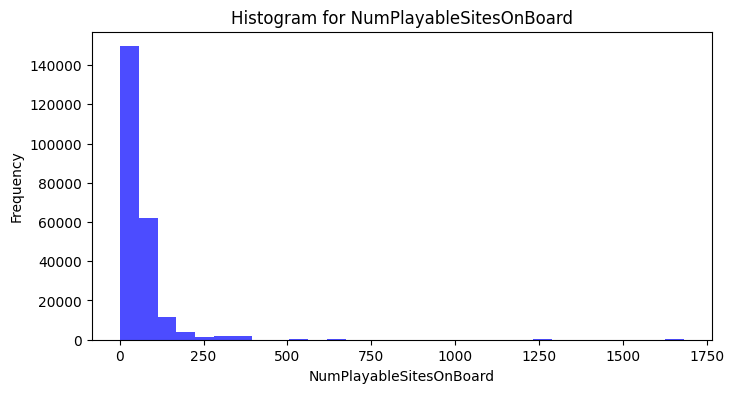

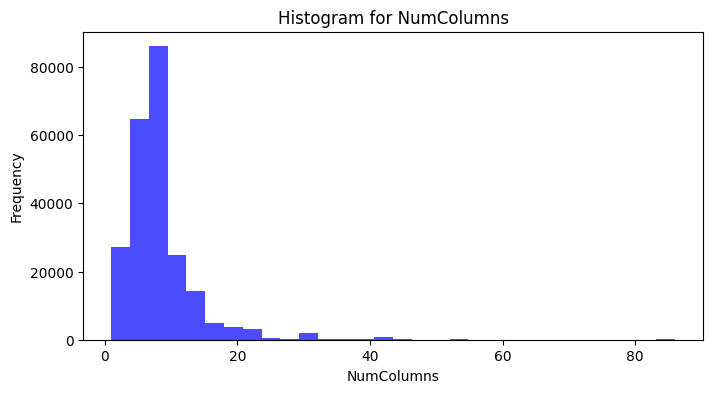

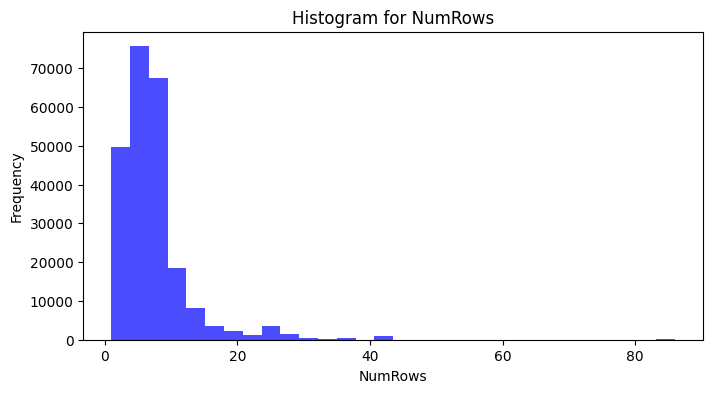

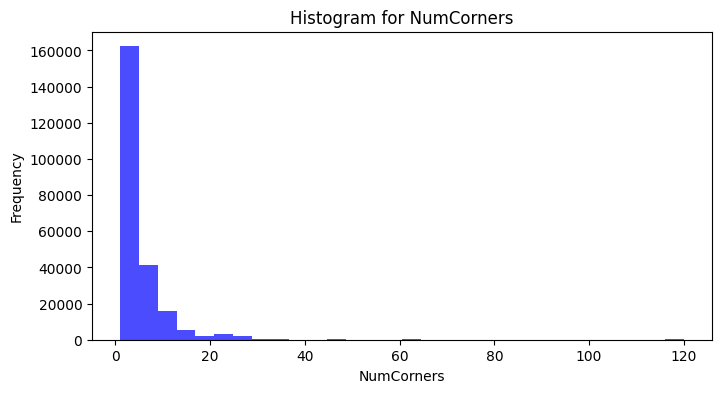

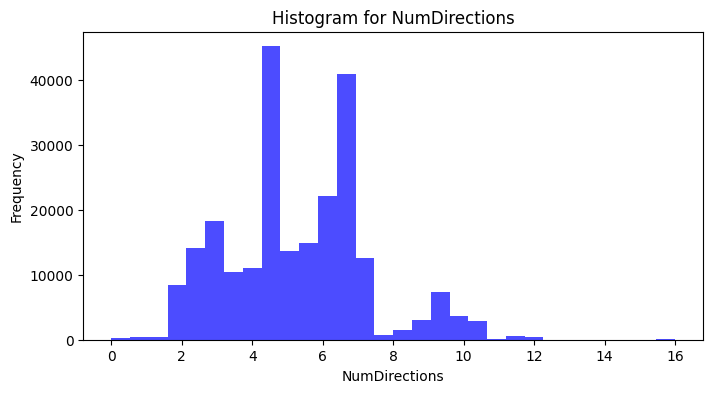

...

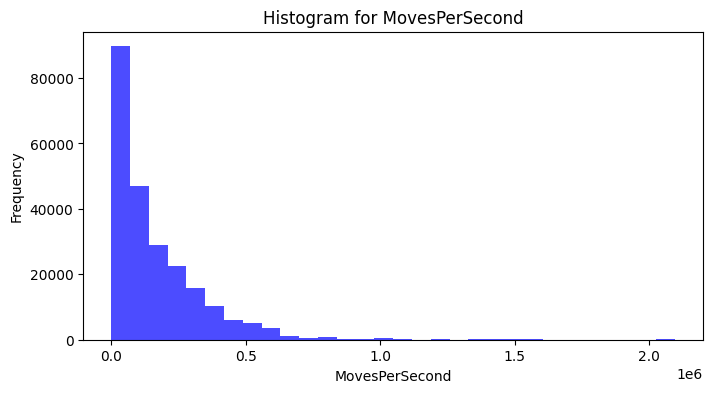

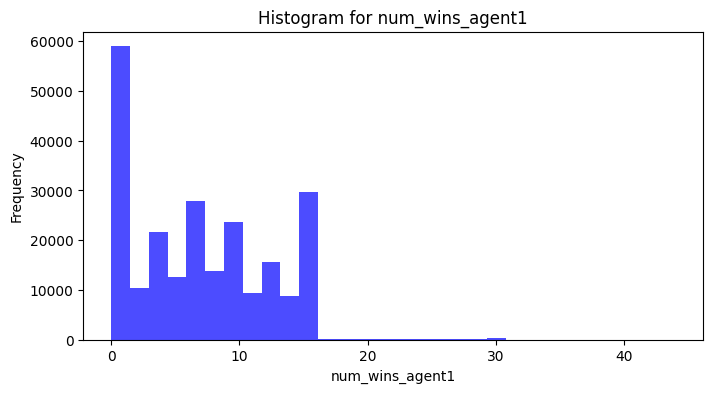

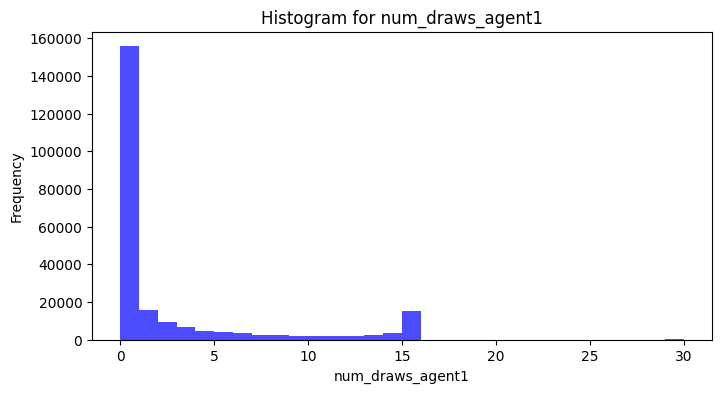

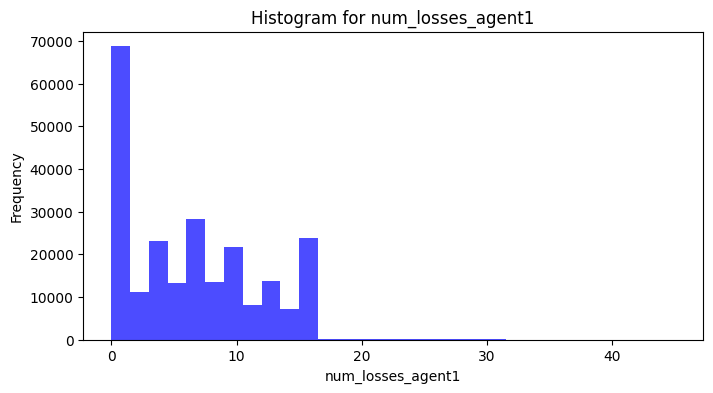

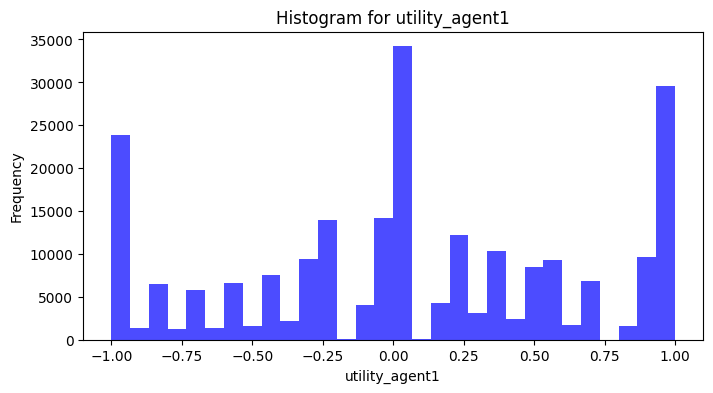

In [23]:

# Filter non-binary columns
non_binary_columns = [col for col in df.columns if df[col].nunique() > 2 and df[col].dtype in ['float64', 'int64']]

# Plot histograms for non-binary columns
for col in non_binary_columns:
    plt.figure(figsize=(8, 4))
    plt.hist(df[col].dropna(), bins=30, alpha=0.7, color='blue')
    plt.title(f"Histogram for {col}")
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()


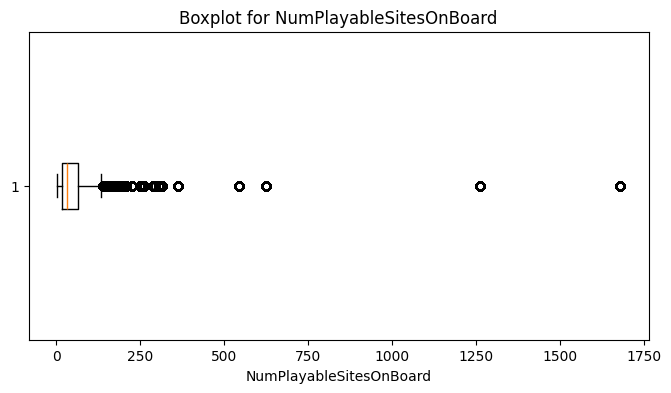

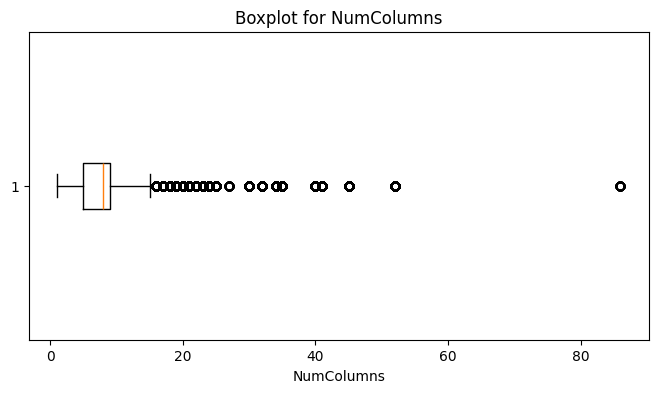

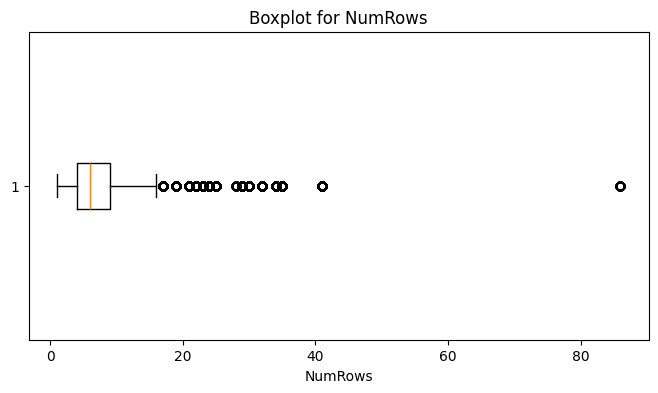

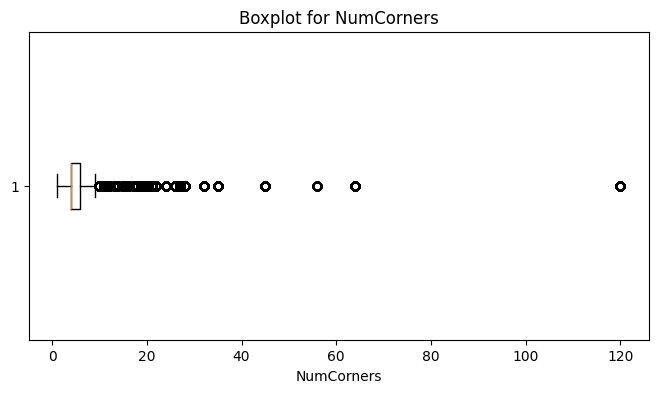

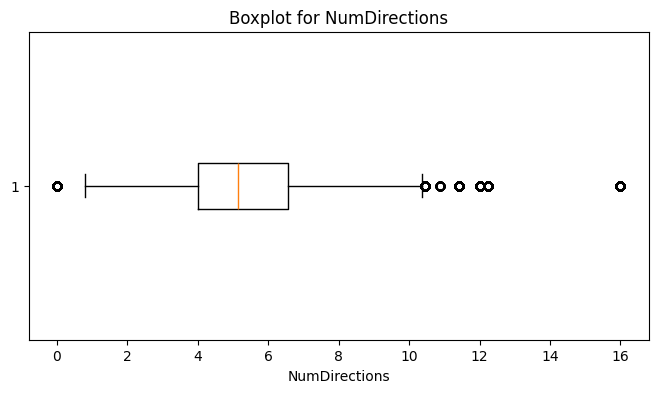

...

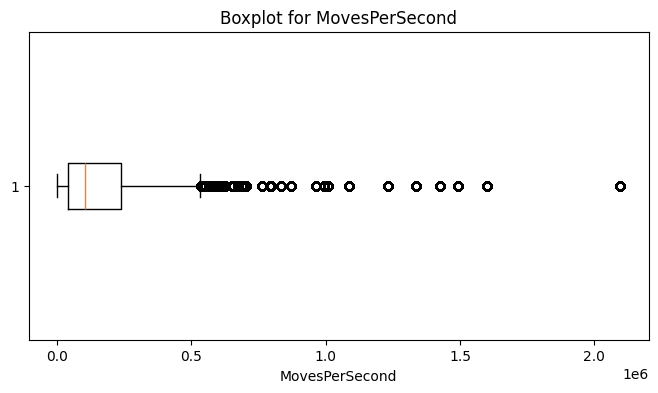

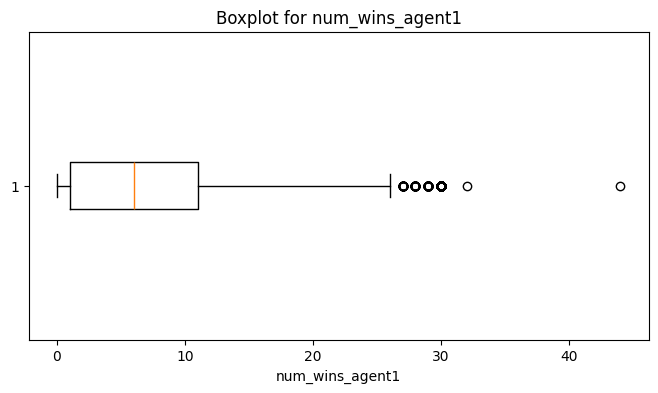

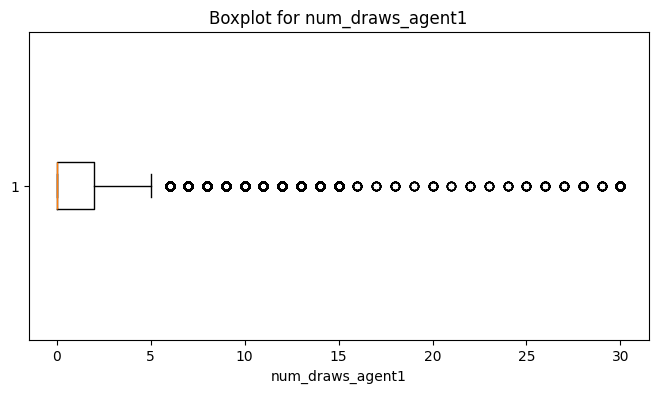

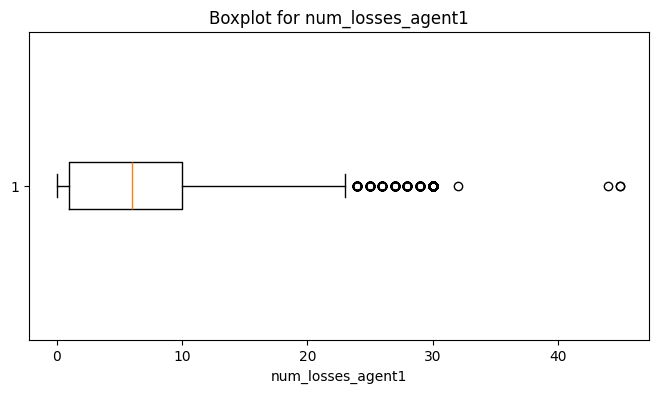

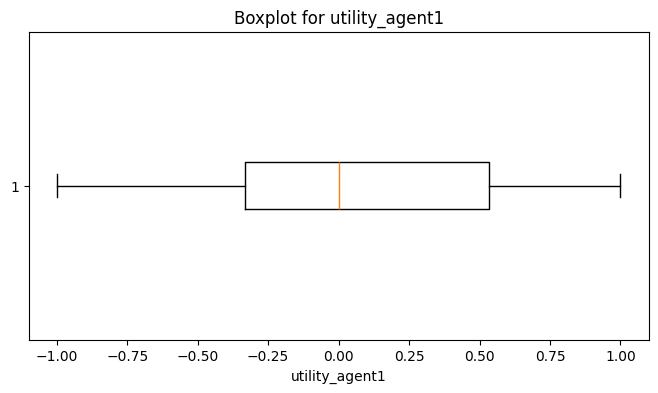

In [24]:
# Plot box plots for non-binary columns
for col in non_binary_columns:
    plt.figure(figsize=(8, 4))
    plt.boxplot(df[col].dropna(), vert=False)
    plt.title(f"Boxplot for {col}")
    plt.xlabel(col)
    plt.show()


C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 1200x1000 with 0 Axes>

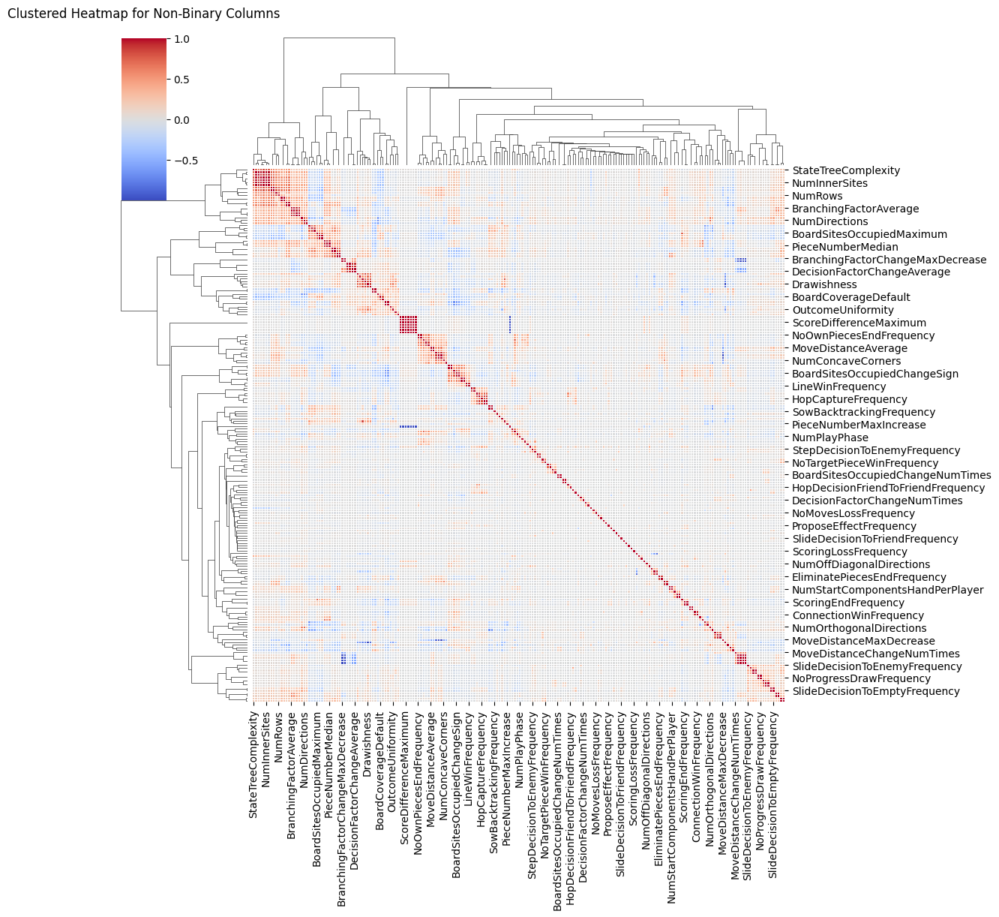

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram

# Filter non-binary columns
non_binary_columns = [col for col in df.columns if df[col].nunique() > 2 and df[col].dtype in ['float64', 'int64']]

# Compute correlation matrix for non-binary columns
correlation_matrix = df[non_binary_columns].corr()

# Perform hierarchical clustering
linkage_matrix = linkage(correlation_matrix, method='ward')

# Plot the clustered heatmap
plt.figure(figsize=(12, 10))
sns.clustermap(
    correlation_matrix, 
    cmap="coolwarm", 
    annot=False, 
    fmt=".2f", 
    linewidths=0.5, 
    figsize=(12, 12), 
    method='ward'
)
plt.title("Clustered Heatmap for Non-Binary Columns", pad=20)
plt.show()


### Strong Correlation 

C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


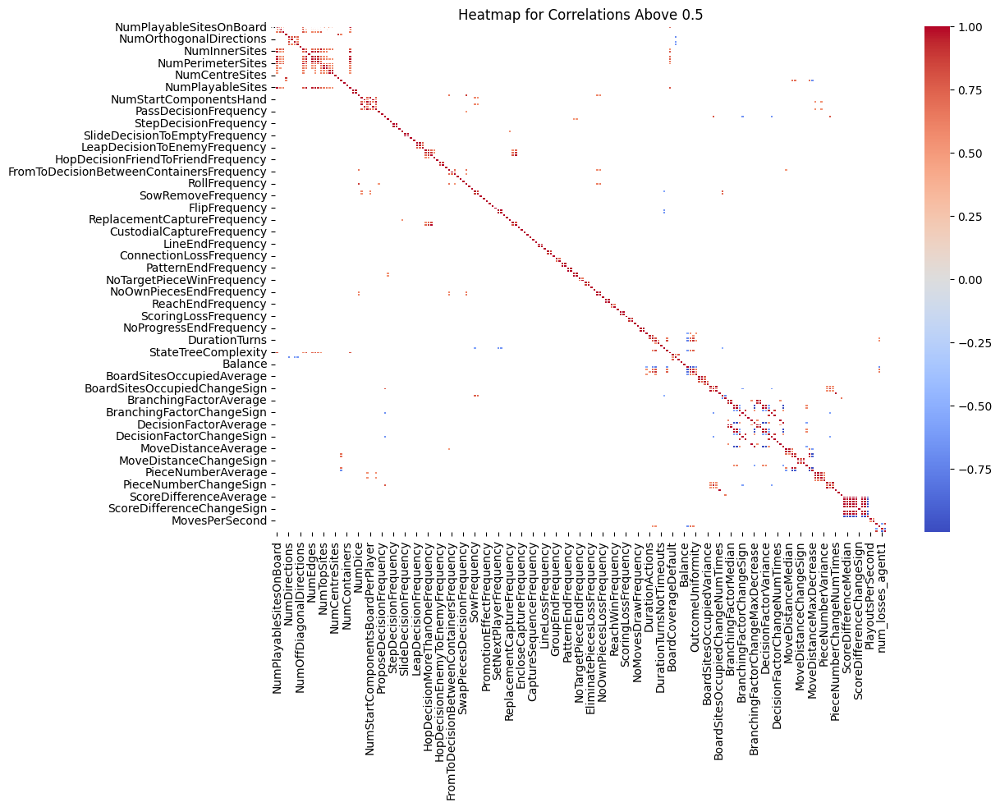

In [26]:
# Set a correlation threshold
threshold = 0.5
strong_correlation = correlation_matrix[(correlation_matrix > threshold) | (correlation_matrix < -threshold)]

# Plot the filtered heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(strong_correlation, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title(f"Heatmap for Correlations Above {threshold}")
plt.show()


In [32]:
df.head()

,GameRulesetName,agent1,agent2,Stochastic,Asymmetric,AsymmetricForces,AsymmetricPiecesType,PlayersWithDirections,Cooperation,Team,...,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond,EnglishRules,LudRules,num_wins_agent1,num_draws_agent1,num_losses_agent1,utility_agent1
0,00Y,MCTS-ProgressiveHistory-0.1-MAST-false,MCTS-ProgressiveHistory-0.6-Random200-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",4,0,11,-0.466667
1,00Y,MCTS-ProgressiveHistory-0.1-MAST-false,MCTS-UCB1GRAVE-0.6-NST-true,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333
2,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.1-NST-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",7,0,8,-0.066667
3,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.6-NST-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333
4,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1GRAVE-1.41421356237-NST-false,0,0,0,0,0,0,0,...,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ...",5,0,10,-0.333333


In [33]:
game_cols = ['GameRulesetName','EnglishRules','LudRules']
output_cols     = ['num_wins_agent1', 'num_draws_agent1', 'num_losses_agent1']

more_drops = game_cols + output_cols

In [34]:
dfn = df.copy()

In [35]:
dfn = dfn.drop(columns=more_drops)


In [36]:
dfn.head()

,agent1,agent2,Stochastic,Asymmetric,AsymmetricForces,AsymmetricPiecesType,PlayersWithDirections,Cooperation,Team,Shape,...,PlayerValue,Efficiency,CopyContext,Then,ForEachPiece,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond,utility_agent1
0,MCTS-ProgressiveHistory-0.1-MAST-false,MCTS-ProgressiveHistory-0.6-Random200-false,0,0,0,0,0,0,0,1,...,0,1,0,1,0,0,1,298.07,18877.17,-0.466667
1,MCTS-ProgressiveHistory-0.1-MAST-false,MCTS-UCB1GRAVE-0.6-NST-true,0,0,0,0,0,0,0,1,...,0,1,0,1,0,0,1,298.07,18877.17,-0.333333
2,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.1-NST-false,0,0,0,0,0,0,0,1,...,0,1,0,1,0,0,1,298.07,18877.17,-0.066667
3,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.6-NST-false,0,0,0,0,0,0,0,1,...,0,1,0,1,0,0,1,298.07,18877.17,-0.333333
4,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1GRAVE-1.41421356237-NST-false,0,0,0,0,0,0,0,1,...,0,1,0,1,0,0,1,298.07,18877.17,-0.333333


In [37]:
agent_cols = ['agent1', 'agent2']

In [38]:
def preprocess_agent_cols(df, agent_cols, split_agent_features=True):
    if split_agent_features:
        for col in agent_cols:
            # Split column values by '-' and expand into separate columns
            split_cols = df[col].str.split("-", expand=True)
            split_cols.columns = [f"{col}_{i}" for i in range(split_cols.shape[1])]
            df = pd.concat([df, split_cols], axis=1).drop(columns=col)
            # Drop the first split column (equivalent to dropping "{col}_0")
            if f"{col}_0" in df.columns:
                df = df.drop(columns=f"{col}_0")
    
    # Convert columns related to agent_cols to categorical
    for col in df.columns:
        if any(col.startswith(agent_col) for agent_col in agent_cols):
            df[col] = df[col].astype('category')
        else:
            # Convert other columns to float
            df[col] = pd.to_numeric(df[col], errors='coerce')

    print(f'---> Shapes = {df.shape}')
    return df


In [39]:
dfn = preprocess_agent_cols(dfn, agent_cols)


---> Shapes = (233234, 597)


In [40]:
dfn.head()

,Stochastic,Asymmetric,AsymmetricForces,AsymmetricPiecesType,PlayersWithDirections,Cooperation,Team,Shape,SquareShape,HexShape,...,MovesPerSecond,utility_agent1,agent1_1,agent1_2,agent1_3,agent1_4,agent2_1,agent2_2,agent2_3,agent2_4
0,0,0,0,0,0,0,0,1,0,0,...,18877.17,-0.466667,ProgressiveHistory,0.1,MAST,false,ProgressiveHistory,0.6,Random200,false
1,0,0,0,0,0,0,0,1,0,0,...,18877.17,-0.333333,ProgressiveHistory,0.1,MAST,false,UCB1GRAVE,0.6,NST,true
2,0,0,0,0,0,0,0,1,0,0,...,18877.17,-0.066667,ProgressiveHistory,0.1,MAST,true,UCB1,0.1,NST,false
3,0,0,0,0,0,0,0,1,0,0,...,18877.17,-0.333333,ProgressiveHistory,0.1,MAST,true,UCB1,0.6,NST,false
4,0,0,0,0,0,0,0,1,0,0,...,18877.17,-0.333333,ProgressiveHistory,0.1,MAST,true,UCB1GRAVE,1.41421356237,NST,false


In [41]:
def encode_dfn(df):
    # Encoding for agent1 columns
    df['agent1_1'] = df['agent1_1'].map({
        'UCB1Tuned': 0, 
        'UCB1GRAVE': 1, 
        'UCB1': 2, 
        'ProgressiveHistory': 3
    }).astype(int)
    df['agent1_2'] = df['agent1_2'].map({
        '0.1': 0, 
        '0.6': 1, 
        '1.41421356237': 2
    }).astype(int)
    df['agent1_3'] = df['agent1_3'].map({
        'Random200': 0, 
        'MAST': 1, 
        'NST': 2
    }).astype(int)
    df['agent1_4'] = df['agent1_4'].map({
        'false': 0, 
        'true': 1
    }).astype(int)

    # Encoding for agent2 columns
    df['agent2_1'] = df['agent2_1'].map({
        'UCB1Tuned': 0, 
        'UCB1GRAVE': 1, 
        'UCB1': 2, 
        'ProgressiveHistory': 3
    }).astype(int)
    df['agent2_2'] = df['agent2_2'].map({
        '0.1': 0, 
        '0.6': 1, 
        '1.41421356237': 2
    }).astype(int)
    df['agent2_3'] = df['agent2_3'].map({
        'Random200': 0, 
        'MAST': 1, 
        'NST': 2
    }).astype(int)
    df['agent2_4'] = df['agent2_4'].map({
        'false': 0, 
        'true': 1
    }).astype(int)

    return df

# Apply encoding to the dfn dataframe
dfn = encode_dfn(dfn)


In [42]:
dfn.head()

,Stochastic,Asymmetric,AsymmetricForces,AsymmetricPiecesType,PlayersWithDirections,Cooperation,Team,Shape,SquareShape,HexShape,...,MovesPerSecond,utility_agent1,agent1_1,agent1_2,agent1_3,agent1_4,agent2_1,agent2_2,agent2_3,agent2_4
0,0,0,0,0,0,0,0,1,0,0,...,18877.17,-0.466667,3,0,1,0,3,1,0,0
1,0,0,0,0,0,0,0,1,0,0,...,18877.17,-0.333333,3,0,1,0,1,1,2,1
2,0,0,0,0,0,0,0,1,0,0,...,18877.17,-0.066667,3,0,1,1,2,0,2,0
3,0,0,0,0,0,0,0,1,0,0,...,18877.17,-0.333333,3,0,1,1,2,1,2,0
4,0,0,0,0,0,0,0,1,0,0,...,18877.17,-0.333333,3,0,1,1,1,2,2,0


In [43]:
test_data = pd.read_csv("test.csv")
test_data.head()

,Id,GameRulesetName,agent1,agent2,Properties,Format,Time,Discrete,Realtime,Turns,...,Efficiency,CopyContext,Then,ForEachPiece,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond,EnglishRules,LudRules
0,233234,00Y,MCTS-UCB1-0.6-NST-false,MCTS-ProgressiveHistory-0.1-MAST-true,1,1,1,1,0,1,...,1,0,1,0,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ..."
1,233235,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.6-NST-false,1,1,1,1,0,1,...,1,0,1,0,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ..."
2,233236,00Y,MCTS-UCB1Tuned-0.1-Random200-true,MCTS-ProgressiveHistory-0.1-MAST-true,1,1,1,1,0,1,...,1,0,1,0,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ..."


In [46]:
nan_columns = [col for col in test_data.columns if test_data[col].isna().any()]
print("Columns with NaN values:", nan_columns)


Columns with NaN values: ['Behaviour', 'StateRepetition', 'Duration', 'Complexity', 'BoardCoverage', 'GameOutcome', 'StateEvaluation', 'Clarity', 'Decisiveness', 'Drama', 'MoveEvaluation', 'StateEvaluationDifference', 'BoardSitesOccupied', 'BranchingFactor', 'DecisionFactor', 'MoveDistance', 'PieceNumber', 'ScoreDifference']


In [47]:
len(nan_columns)

18

In [48]:
test_data = test_data.drop(columns= nan_columns)

In [49]:
test_data.head()

,Id,GameRulesetName,agent1,agent2,Properties,Format,Time,Discrete,Realtime,Turns,...,Efficiency,CopyContext,Then,ForEachPiece,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond,EnglishRules,LudRules
0,233234,00Y,MCTS-UCB1-0.6-NST-false,MCTS-ProgressiveHistory-0.1-MAST-true,1,1,1,1,0,1,...,1,0,1,0,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ..."
1,233235,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.6-NST-false,1,1,1,1,0,1,...,1,0,1,0,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ..."
2,233236,00Y,MCTS-UCB1Tuned-0.1-Random200-true,MCTS-ProgressiveHistory-0.1-MAST-true,1,1,1,1,0,1,...,1,0,1,0,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ..."


In [50]:
# List of columns to drop
columns_to_drop = ['Properties', 'Format', 'Time', 'Discrete', 'Realtime', 'Turns', 'Alternating', 'Simultaneous', 
                   'HiddenInformation', 'Match', 'AsymmetricRules', 'AsymmetricPlayRules', 'AsymmetricEndRules', 
                   'AsymmetricSetup', 'Players', 'NumPlayers', 'Simulation', 'Solitaire', 'TwoPlayer', 'Multiplayer', 
                   'Coalition', 'Puzzle', 'DeductionPuzzle', 'PlanningPuzzle', 'Equipment', 'Container', 'Board', 
                   'PrismShape', 'ParallelogramShape', 'RectanglePyramidalShape', 'TargetShape', 'BrickTiling', 
                   'CelticTiling', 'QuadHexTiling', 'Hints', 'PlayableSites', 'Component', 'DiceD3', 'BiasedDice', 
                   'Card', 'Domino', 'Rules', 'SituationalTurnKo', 'SituationalSuperko', 'InitialAmount', 'InitialPot', 
                   'Play', 'BetDecision', 'BetDecisionFrequency', 'VoteDecisionFrequency', 'ChooseTrumpSuitDecision', 
                   'ChooseTrumpSuitDecisionFrequency', 'LeapDecisionToFriend', 'LeapDecisionToFriendFrequency', 
                   'HopDecisionEnemyToFriend', 'HopDecisionEnemyToFriendFrequency', 'HopDecisionFriendToFriend', 
                   'FromToDecisionWithinBoard', 'FromToDecisionBetweenContainers', 'BetEffect', 'BetEffectFrequency', 
                   'VoteEffectFrequency', 'SwapPlayersEffectFrequency', 'TakeControl', 'TakeControlFrequency', 
                   'PassEffectFrequency', 'SetCost', 'SetCostFrequency', 'SetPhase', 'SetPhaseFrequency', 
                   'SetTrumpSuit', 'SetTrumpSuitFrequency', 'StepEffectFrequency', 'SlideEffectFrequency', 
                   'LeapEffectFrequency', 'HopEffectFrequency', 'FromToEffectFrequency', 'SwapPiecesEffect', 
                   'SwapPiecesEffectFrequency', 'ShootEffect', 'ShootEffectFrequency', 'MaxCapture', 
                   'OffDiagonalDirection', 'Information', 'HidePieceType', 'HidePieceOwner', 'HidePieceCount', 
                   'HidePieceRotation', 'HidePieceValue', 'HidePieceState', 'InvisiblePiece', 'End', 'LineDrawFrequency', 
                   'ConnectionDraw', 'ConnectionDrawFrequency', 'GroupLossFrequency', 'GroupDrawFrequency', 
                   'LoopLossFrequency', 'LoopDraw', 'LoopDrawFrequency', 'PatternLoss', 'PatternLossFrequency', 
                   'PatternDraw', 'PatternDrawFrequency', 'PathExtentEndFrequency', 'PathExtentWinFrequency', 
                   'PathExtentLossFrequency', 'PathExtentDraw', 'PathExtentDrawFrequency', 'TerritoryLoss', 
                   'TerritoryLossFrequency', 'TerritoryDraw', 'TerritoryDrawFrequency', 'CheckmateLoss', 
                   'CheckmateLossFrequency', 'CheckmateDraw', 'CheckmateDrawFrequency', 'NoTargetPieceLoss', 
                   'NoTargetPieceLossFrequency', 'NoTargetPieceDraw', 'NoTargetPieceDrawFrequency', 'NoOwnPiecesDraw', 
                   'NoOwnPiecesDrawFrequency', 'FillLoss', 'FillLossFrequency', 'FillDraw', 'FillDrawFrequency', 
                   'ScoringDrawFrequency', 'NoProgressWin', 'NoProgressWinFrequency', 'NoProgressLoss', 
                   'NoProgressLossFrequency', 'SolvedEnd', 'PositionalRepetition', 'SituationalRepetition', 
                   'Narrowness', 'Variance', 'DecisivenessMoves', 'DecisivenessThreshold', 'LeadChange', 'Stability', 
                   'DramaAverage', 'DramaMedian', 'DramaMaximum', 'DramaMinimum', 'DramaVariance', 'DramaChangeAverage', 
                   'DramaChangeSign', 'DramaChangeLineBestFit', 'DramaChangeNumTimes', 'DramaMaxIncrease', 
                   'DramaMaxDecrease', 'MoveEvaluationAverage', 'MoveEvaluationMedian', 'MoveEvaluationMaximum', 
                   'MoveEvaluationMinimum', 'MoveEvaluationVariance', 'MoveEvaluationChangeAverage', 
                   'MoveEvaluationChangeSign', 'MoveEvaluationChangeLineBestFit', 'MoveEvaluationChangeNumTimes', 
                   'MoveEvaluationMaxIncrease', 'MoveEvaluationMaxDecrease', 'StateEvaluationDifferenceAverage', 
                   'StateEvaluationDifferenceMedian', 'StateEvaluationDifferenceMaximum', 
                   'StateEvaluationDifferenceMinimum', 'StateEvaluationDifferenceVariance', 
                   'StateEvaluationDifferenceChangeAverage', 'StateEvaluationDifferenceChangeSign', 
                   'StateEvaluationDifferenceChangeLineBestFit', 'StateEvaluationDifferenceChangeNumTimes', 
                   'StateEvaluationDifferenceMaxIncrease', 'StateEvaluationDifferenceMaxDecrease', 
                   'BoardSitesOccupiedMinimum', 'BranchingFactorMinimum', 'DecisionFactorMinimum', 'MoveDistanceMinimum', 
                   'PieceNumberMinimum', 'ScoreDifferenceMinimum', 'ScoreDifferenceChangeNumTimes', 'Roots', 'Cosine', 
                   'Sine', 'Tangent', 'Exponential', 'Logarithm', 'ExclusiveDisjunction', 'Float', 'HandComponent', 
                   'SetHidden', 'SetInvisible', 'SetHiddenCount', 'SetHiddenRotation', 'SetHiddenState', 
                   'SetHiddenValue', 'SetHiddenWhat', 'SetHiddenWho']

# Drop the specified columns
test_data = test_data.drop(columns=columns_to_drop, errors='ignore')


In [51]:
test_data.head()

,Id,GameRulesetName,agent1,agent2,Stochastic,Asymmetric,AsymmetricForces,AsymmetricPiecesType,PlayersWithDirections,Cooperation,...,Efficiency,CopyContext,Then,ForEachPiece,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond,EnglishRules,LudRules
0,233234,00Y,MCTS-UCB1-0.6-NST-false,MCTS-ProgressiveHistory-0.1-MAST-true,0,0,0,0,0,0,...,1,0,1,0,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ..."
1,233235,00Y,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.6-NST-false,0,0,0,0,0,0,...,1,0,1,0,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ..."
2,233236,00Y,MCTS-UCB1Tuned-0.1-Random200-true,MCTS-ProgressiveHistory-0.1-MAST-true,0,0,0,0,0,0,...,1,0,1,0,0,1,298.07,18877.17,Goal: Connect all three edge colors with a sin...,"(game ""00'Y'"" (players 2) (equipment { (board ..."


In [52]:
game_cols = ['GameRulesetName','EnglishRules','LudRules']

In [53]:
test_data = test_data.drop(columns= game_cols)

In [56]:
test_data = test_data.drop("Id", axis = 1)
test_data.head()

,agent1,agent2,Stochastic,Asymmetric,AsymmetricForces,AsymmetricPiecesType,PlayersWithDirections,Cooperation,Team,Shape,...,SetInternalCounter,PlayerValue,Efficiency,CopyContext,Then,ForEachPiece,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond
0,MCTS-UCB1-0.6-NST-false,MCTS-ProgressiveHistory-0.1-MAST-true,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,0,1,298.07,18877.17
1,MCTS-ProgressiveHistory-0.1-MAST-true,MCTS-UCB1-0.6-NST-false,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,0,1,298.07,18877.17
2,MCTS-UCB1Tuned-0.1-Random200-true,MCTS-ProgressiveHistory-0.1-MAST-true,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,0,1,298.07,18877.17


In [57]:
agent_cols = ['agent1', 'agent2']

In [58]:
def preprocess_agent_cols(df, agent_cols, split_agent_features=True):
    if split_agent_features:
        for col in agent_cols:
            # Split column values by '-' and expand into separate columns
            split_cols = df[col].str.split("-", expand=True)
            split_cols.columns = [f"{col}_{i}" for i in range(split_cols.shape[1])]
            df = pd.concat([df, split_cols], axis=1).drop(columns=col)
            # Drop the first split column (equivalent to dropping "{col}_0")
            if f"{col}_0" in df.columns:
                df = df.drop(columns=f"{col}_0")
    
    # Convert columns related to agent_cols to categorical
    for col in df.columns:
        if any(col.startswith(agent_col) for agent_col in agent_cols):
            df[col] = df[col].astype('category')
        else:
            # Convert other columns to float
            df[col] = pd.to_numeric(df[col], errors='coerce')

    print(f'---> Shapes = {df.shape}')
    return df


In [59]:
test_data = preprocess_agent_cols(test_data, agent_cols)

---> Shapes = (3, 596)


In [60]:
test_data =encode_dfn(test_data)
test_data.head()

,Stochastic,Asymmetric,AsymmetricForces,AsymmetricPiecesType,PlayersWithDirections,Cooperation,Team,Shape,SquareShape,HexShape,...,PlayoutsPerSecond,MovesPerSecond,agent1_1,agent1_2,agent1_3,agent1_4,agent2_1,agent2_2,agent2_3,agent2_4
0,0,0,0,0,0,0,0,1,0,0,...,298.07,18877.17,2,1,2,0,3,0,1,1
1,0,0,0,0,0,0,0,1,0,0,...,298.07,18877.17,3,0,1,1,2,1,2,0
2,0,0,0,0,0,0,0,1,0,0,...,298.07,18877.17,0,0,0,1,3,0,1,1


In [61]:
import optuna
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error as mse
from catboost import CatBoostRegressor

class MD_CatBoost:
    def __init__(self, early_stop, n_splits, dfn, target_col):
        self.early_stop = early_stop
        self.n_splits = n_splits
        self.dfn = dfn
        self.target_col = target_col
        self.models = []
        self.best_params = None

    def objective(self, trial):
        # Define the search space for hyperparameters
        params = {
            'iterations': trial.suggest_int('iterations', 500, 3000),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
            'depth': trial.suggest_int('depth', 4, 10),
            'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
            'bagging_temperature': trial.suggest_uniform('bagging_temperature', 0, 1),
            'random_strength': trial.suggest_uniform('random_strength', 0, 1),
            'task_type': 'GPU',  # Use GPU if available; change to 'CPU' if not
            'loss_function': 'RMSE',
            'eval_metric': 'RMSE',
            'verbose': False
        }

        # Perform cross-validation
        _, _, scores = self.train_catboost(params, "Optuna Optimization")
        return np.mean(scores)

    def train_catboost(self, params, title):
        # Prepare data
        X = self.dfn.drop(columns=[self.target_col])
        y = self.dfn[self.target_col]

        # Initialize KFold cross-validation
        cv = KFold(n_splits=self.n_splits, shuffle=True, random_state=42)
        scores = []
        oof_preds = np.zeros(len(X))

        # Perform cross-validation
        for train_idx, valid_idx in cv.split(X, y):
            X_train, X_valid = X.iloc[train_idx], X.iloc[valid_idx]
            y_train, y_valid = y.iloc[train_idx], y.iloc[valid_idx]

            # Train model
            model = CatBoostRegressor(**params)
            model.fit(X_train, y_train, eval_set=(X_valid, y_valid), early_stopping_rounds=self.early_stop, verbose=False)

            # Store predictions and calculate RMSE
            oof_preds[valid_idx] = model.predict(X_valid)
            score = mse(y_valid, oof_preds[valid_idx], squared=False)
            scores.append(score)
            self.models.append(model)

        print(f"{title} | CV RMSE: {np.mean(scores):.4f} ± {np.std(scores):.4f}")
        return self.models, oof_preds, scores

    def infer_catboost(self, data):
        # Average predictions from all models
        predictions = np.mean([model.predict(data) for model in self.models], axis=0)
        return predictions

    def optimize(self, n_trials=100):
        # Perform Optuna optimization
        study = optuna.create_study(direction="minimize", sampler=optuna.samplers.TPESampler(seed=42))
        study.optimize(self.objective, n_trials=n_trials, show_progress_bar=True)

        # Save the best parameters
        self.best_params = study.best_params
        print("Best trial:")
        print(f" Value: {study.best_trial.value}")
        print(" Params:")
        for key, value in self.best_params.items():
            print(f" {key}: {value}")
        return self.best_params

# Usage
target_col = 'utility_agent1'  # Replace with your target column
early_stop = 100                        # Number of rounds for early stopping
n_splits = 5                            # Number of folds for CV

# Initialize the MD_CatBoost class
model = MD_CatBoost(early_stop=early_stop, n_splits=n_splits, dfn=dfn, target_col=target_col)

# Optimize hyperparameters
best_params = model.optimize(n_trials=50)

# Train the model with the best parameters
models, oof_preds, scores = model.train_catboost(best_params, "CatBoost Final Model")

# Infer predictions on new data
test_predictions = model.infer_catboost(test_data)  


  0%|          | 0/50 [00:00<?, ?it/s]

C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2539 ± 0.0008
[I 2024-11-22 20:40:21,115] Trial 0 finished with value: 0.253946356896556 and parameters: {'iterations': 1436, 'learning_rate': 0.2536999076681772, 'depth': 9, 'l2_leaf_reg': 0.24810409748678125, 'bagging_temperature': 0.15601864044243652, 'random_strength': 0.15599452033620265}. Best is trial 0 with value: 0.253946356896556.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2711 ± 0.0009
[I 2024-11-22 20:41:18,840] Trial 1 finished with value: 0.27105644178077676 and parameters: {'iterations': 645, 'learning_rate': 0.19030368381735815, 'depth': 8, 'l2_leaf_reg': 0.679657809075816, 'bagging_temperature': 0.020584494295802447, 'random_strength': 0.9699098521619943}. Best is trial 0 with value: 0.253946356896556.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.3612 ± 0.0009
[I 2024-11-22 20:43:17,233] Trial 2 finished with value: 0.36117659572927785 and parameters: {'iterations': 2581, 'learning_rate': 0.020589728197687916, 'depth': 5, 'l2_leaf_reg': 0.00541524411940254, 'bagging_temperature': 0.3042422429595377, 'random_strength': 0.5247564316322378}. Best is trial 0 with value: 0.253946356896556.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.3125 ± 0.0010
[I 2024-11-22 20:45:29,033] Trial 3 finished with value: 0.31246522990054704 and parameters: {'iterations': 1580, 'learning_rate': 0.02692655251486473, 'depth': 8, 'l2_leaf_reg': 0.003613894271216527, 'bagging_temperature': 0.29214464853521815, 'random_strength': 0.3663618432936917}. Best is trial 0 with value: 0.253946356896556.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2983 ± 0.0006
[I 2024-11-22 20:46:55,072] Trial 4 finished with value: 0.2982630318666297 and parameters: {'iterations': 1640, 'learning_rate': 0.14447746112718687, 'depth': 5, 'l2_leaf_reg': 0.11400863701127326, 'bagging_temperature': 0.5924145688620425, 'random_strength': 0.046450412719997725}. Best is trial 0 with value: 0.253946356896556.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.4043 ± 0.0010
[I 2024-11-22 20:48:20,995] Trial 5 finished with value: 0.40425064213112727 and parameters: {'iterations': 2019, 'learning_rate': 0.0178601378893971, 'depth': 4, 'l2_leaf_reg': 6.245139574743075, 'bagging_temperature': 0.9656320330745594, 'random_strength': 0.8083973481164611}. Best is trial 0 with value: 0.253946356896556.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.3558 ± 0.0008
[I 2024-11-22 20:50:07,735] Trial 6 finished with value: 0.3557556199122519 and parameters: {'iterations': 1261, 'learning_rate': 0.013940346079873234, 'depth': 8, 'l2_leaf_reg': 0.057624872164786026, 'bagging_temperature': 0.12203823484477883, 'random_strength': 0.4951769101112702}. Best is trial 0 with value: 0.253946356896556.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.3239 ± 0.0017
[I 2024-11-22 20:50:50,110] Trial 7 finished with value: 0.3238877075543679 and parameters: {'iterations': 586, 'learning_rate': 0.22038218939289875, 'depth': 5, 'l2_leaf_reg': 0.4467752817973907, 'bagging_temperature': 0.31171107608941095, 'random_strength': 0.5200680211778108}. Best is trial 0 with value: 0.253946356896556.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_temperature', 0, 1),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:23: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0, 1),
C:\U

Optuna Optimization | CV RMSE: 0.2909 ± 0.0008
[I 2024-11-22 20:55:13,644] Trial 8 finished with value: 0.2908779517044942 and parameters: {'iterations': 1867, 'learning_rate': 0.01875220945578641, 'depth': 10, 'l2_leaf_reg': 1.2604664585649468, 'bagging_temperature': 0.9394989415641891, 'random_strength': 0.8948273504276488}. Best is trial 0 with value: 0.253946356896556.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.3007 ± 0.0007
[I 2024-11-22 20:56:48,277] Trial 9 finished with value: 0.3006629610031947 and parameters: {'iterations': 1995, 'learning_rate': 0.22999586428143728, 'depth': 4, 'l2_leaf_reg': 0.006080390190296602, 'bagging_temperature': 0.045227288910538066, 'random_strength': 0.32533033076326434}. Best is trial 0 with value: 0.253946356896556.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2499 ± 0.0008
[I 2024-11-22 21:04:07,842] Trial 10 finished with value: 0.24991659380509987 and parameters: {'iterations': 2863, 'learning_rate': 0.06690992453172917, 'depth': 10, 'l2_leaf_reg': 0.03293669426393943, 'bagging_temperature': 0.6400885024675564, 'random_strength': 0.038725199961182954}. Best is trial 10 with value: 0.24991659380509987.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2502 ± 0.0009
[I 2024-11-22 21:10:58,565] Trial 11 finished with value: 0.2502430282771025 and parameters: {'iterations': 2945, 'learning_rate': 0.08353087730210136, 'depth': 10, 'l2_leaf_reg': 0.032992632816126174, 'bagging_temperature': 0.6725794991132612, 'random_strength': 0.00922737312841293}. Best is trial 10 with value: 0.24991659380509987.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2501 ± 0.0008
[I 2024-11-22 21:17:55,419] Trial 12 finished with value: 0.25014863722067965 and parameters: {'iterations': 2934, 'learning_rate': 0.07761956691643566, 'depth': 10, 'l2_leaf_reg': 0.02083233848547307, 'bagging_temperature': 0.6806722560748432, 'random_strength': 0.0042251242455897675}. Best is trial 10 with value: 0.24991659380509987.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2516 ± 0.0009
[I 2024-11-22 21:24:08,351] Trial 13 finished with value: 0.25158215360869807 and parameters: {'iterations': 2556, 'learning_rate': 0.05512676446870765, 'depth': 10, 'l2_leaf_reg': 0.019367283524941718, 'bagging_temperature': 0.771664143256938, 'random_strength': 0.20882527076262655}. Best is trial 10 with value: 0.24991659380509987.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2494 ± 0.0008
[I 2024-11-22 21:29:27,558] Trial 14 finished with value: 0.24935739180308633 and parameters: {'iterations': 2978, 'learning_rate': 0.08643310250353477, 'depth': 9, 'l2_leaf_reg': 0.0014132462785196034, 'bagging_temperature': 0.4842973072101807, 'random_strength': 0.15578379319318547}. Best is trial 14 with value: 0.24935739180308633.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2917 ± 0.0006
[I 2024-11-22 21:32:11,069] Trial 15 finished with value: 0.291688268333441 and parameters: {'iterations': 2426, 'learning_rate': 0.04106063928642917, 'depth': 7, 'l2_leaf_reg': 0.0019246796030182507, 'bagging_temperature': 0.4970853936108525, 'random_strength': 0.18777968994135863}. Best is trial 14 with value: 0.24935739180308633.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2500 ± 0.0007
[I 2024-11-22 21:36:22,482] Trial 16 finished with value: 0.2499679504208389 and parameters: {'iterations': 2325, 'learning_rate': 0.11104220733742987, 'depth': 9, 'l2_leaf_reg': 0.0010227232450478907, 'bagging_temperature': 0.45057096355494275, 'random_strength': 0.664949289960145}. Best is trial 14 with value: 0.24935739180308633.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2859 ± 0.0006
[I 2024-11-22 21:39:20,057] Trial 17 finished with value: 0.28589400711327084 and parameters: {'iterations': 2773, 'learning_rate': 0.04122973944309366, 'depth': 7, 'l2_leaf_reg': 0.011245846280407956, 'bagging_temperature': 0.8231544958165571, 'random_strength': 0.3074272931976805}. Best is trial 14 with value: 0.24935739180308633.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2557 ± 0.0007
[I 2024-11-22 21:43:08,616] Trial 18 finished with value: 0.25574219199168674 and parameters: {'iterations': 2156, 'learning_rate': 0.07012264870574415, 'depth': 9, 'l2_leaf_reg': 2.8294973231916205, 'bagging_temperature': 0.40040781777749, 'random_strength': 0.12791154603269989}. Best is trial 14 with value: 0.24935739180308633.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2502 ± 0.0008
[I 2024-11-22 21:47:48,170] Trial 19 finished with value: 0.25015884405644195 and parameters: {'iterations': 2686, 'learning_rate': 0.1238031072539551, 'depth': 9, 'l2_leaf_reg': 0.0010342587473591543, 'bagging_temperature': 0.5625128570253415, 'random_strength': 0.2580990803874023}. Best is trial 14 with value: 0.24935739180308633.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.3555 ± 0.0008
[I 2024-11-22 21:48:53,891] Trial 20 finished with value: 0.35547368126767454 and parameters: {'iterations': 1004, 'learning_rate': 0.03659164947476606, 'depth': 6, 'l2_leaf_reg': 0.13497573704976554, 'bagging_temperature': 0.7665966905414896, 'random_strength': 0.41042276366702596}. Best is trial 14 with value: 0.24935739180308633.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2501 ± 0.0012
[I 2024-11-22 21:53:11,644] Trial 21 finished with value: 0.250099159927215 and parameters: {'iterations': 2307, 'learning_rate': 0.11143150660071284, 'depth': 9, 'l2_leaf_reg': 0.0011967673323931532, 'bagging_temperature': 0.39446454471215586, 'random_strength': 0.6712369673505519}. Best is trial 14 with value: 0.24935739180308633.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2491 ± 0.0008
[I 2024-11-22 21:58:36,763] Trial 22 finished with value: 0.24906315944221363 and parameters: {'iterations': 2999, 'learning_rate': 0.09691933397433797, 'depth': 9, 'l2_leaf_reg': 0.0035201820263060946, 'bagging_temperature': 0.4855147663728671, 'random_strength': 0.6614031188325014}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2585 ± 0.0008
[I 2024-11-22 22:02:37,518] Trial 23 finished with value: 0.25846320738140494 and parameters: {'iterations': 2988, 'learning_rate': 0.05974449845246235, 'depth': 8, 'l2_leaf_reg': 0.002531669947849444, 'bagging_temperature': 0.5809826632289876, 'random_strength': 0.6733467046544352}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2509 ± 0.0009
[I 2024-11-22 22:08:45,434] Trial 24 finished with value: 0.25089985669482195 and parameters: {'iterations': 2784, 'learning_rate': 0.0930783842976073, 'depth': 10, 'l2_leaf_reg': 0.009704856463547946, 'bagging_temperature': 0.6607078548743428, 'random_strength': 0.09201577772801944}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2513 ± 0.0008
[I 2024-11-22 22:12:42,949] Trial 25 finished with value: 0.251263907160288 and parameters: {'iterations': 2756, 'learning_rate': 0.15861195237271958, 'depth': 9, 'l2_leaf_reg': 0.03754683175252807, 'bagging_temperature': 0.5173525652140668, 'random_strength': 0.7441785624352308}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2660 ± 0.0008
[I 2024-11-22 22:16:10,405] Trial 26 finished with value: 0.26600659515885383 and parameters: {'iterations': 2492, 'learning_rate': 0.05297822976175397, 'depth': 8, 'l2_leaf_reg': 0.003103237630830863, 'bagging_temperature': 0.43101917184255434, 'random_strength': 0.59704467503944}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2502 ± 0.0010
[I 2024-11-22 22:21:56,786] Trial 27 finished with value: 0.25017213212038425 and parameters: {'iterations': 2976, 'learning_rate': 0.10100881962375514, 'depth': 10, 'l2_leaf_reg': 0.008972733525647923, 'bagging_temperature': 0.352095672092444, 'random_strength': 0.4468320510205547}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2709 ± 0.0008
[I 2024-11-22 22:25:08,140] Trial 28 finished with value: 0.27087021212066825 and parameters: {'iterations': 2657, 'learning_rate': 0.06657596582821133, 'depth': 7, 'l2_leaf_reg': 0.06960883924496508, 'bagging_temperature': 0.8612272099908851, 'random_strength': 0.249433810161391}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2553 ± 0.0009
[I 2024-11-22 22:27:12,747] Trial 29 finished with value: 0.25529924350021954 and parameters: {'iterations': 2196, 'learning_rate': 0.2974293928652373, 'depth': 9, 'l2_leaf_reg': 0.20434587069222504, 'bagging_temperature': 0.16434365252616934, 'random_strength': 0.07081830983187529}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2512 ± 0.0010
[I 2024-11-22 22:31:04,866] Trial 30 finished with value: 0.25122448016666526 and parameters: {'iterations': 2776, 'learning_rate': 0.16237504030820227, 'depth': 9, 'l2_leaf_reg': 0.01622663257665377, 'bagging_temperature': 0.4990093806463504, 'random_strength': 0.13973911932293054}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2500 ± 0.0008
[I 2024-11-22 22:35:33,786] Trial 31 finished with value: 0.2499726597878306 and parameters: {'iterations': 2417, 'learning_rate': 0.13679291906226468, 'depth': 9, 'l2_leaf_reg': 0.0016003620810288708, 'bagging_temperature': 0.23605963481014774, 'random_strength': 0.6192209619625613}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2516 ± 0.0009
[I 2024-11-22 22:39:39,675] Trial 32 finished with value: 0.2515717357900362 and parameters: {'iterations': 2859, 'learning_rate': 0.0973062649646123, 'depth': 8, 'l2_leaf_reg': 0.0046990706044873765, 'bagging_temperature': 0.46913223938851645, 'random_strength': 0.7988884173719542}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2512 ± 0.0009
[I 2024-11-22 22:45:00,558] Trial 33 finished with value: 0.25116553450605433 and parameters: {'iterations': 2342, 'learning_rate': 0.1125335047434948, 'depth': 10, 'l2_leaf_reg': 0.0020650110425640055, 'bagging_temperature': 0.5802055788948386, 'random_strength': 0.6280662852607565}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2525 ± 0.0011
[I 2024-11-22 22:48:26,101] Trial 34 finished with value: 0.2524952030021476 and parameters: {'iterations': 2573, 'learning_rate': 0.1822758290861323, 'depth': 9, 'l2_leaf_reg': 0.0010180004966012389, 'bagging_temperature': 0.6358709356060621, 'random_strength': 0.9909776637868206}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2668 ± 0.0008
[I 2024-11-22 22:52:14,963] Trial 35 finished with value: 0.2668308921083815 and parameters: {'iterations': 2662, 'learning_rate': 0.04829813745679446, 'depth': 8, 'l2_leaf_reg': 0.005374962988851036, 'bagging_temperature': 0.7289946124453125, 'random_strength': 0.7198430403287307}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2524 ± 0.0008
[I 2024-11-22 22:56:22,538] Trial 36 finished with value: 0.2524189241087428 and parameters: {'iterations': 2236, 'learning_rate': 0.07894185415702064, 'depth': 9, 'l2_leaf_reg': 0.003041539476383659, 'bagging_temperature': 0.4493683107488108, 'random_strength': 0.5625773492379618}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.3518 ± 0.0009
[I 2024-11-22 22:57:54,667] Trial 37 finished with value: 0.3518202042557686 and parameters: {'iterations': 1399, 'learning_rate': 0.02870002734263893, 'depth': 6, 'l2_leaf_reg': 0.0017613750816218195, 'bagging_temperature': 0.535213312252128, 'random_strength': 0.9226194424348833}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2537 ± 0.0007
[I 2024-11-22 23:02:25,044] Trial 38 finished with value: 0.2536923339121398 and parameters: {'iterations': 1749, 'learning_rate': 0.06593272441710833, 'depth': 10, 'l2_leaf_reg': 0.0070143360787377675, 'bagging_temperature': 0.24261953883448112, 'random_strength': 0.8137383455721934}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecat

Optuna Optimization | CV RMSE: 0.2501 ± 0.0010
[I 2024-11-22 23:06:31,811] Trial 39 finished with value: 0.25008187329441445 and parameters: {'iterations': 2880, 'learning_rate': 0.12196815799007969, 'depth': 8, 'l2_leaf_reg': 0.0038880289019308455, 'bagging_temperature': 0.3518260641000173, 'random_strength': 0.49752058236953356}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2591 ± 0.0009
[I 2024-11-22 23:09:29,049] Trial 40 finished with value: 0.25905932484658506 and parameters: {'iterations': 2018, 'learning_rate': 0.08845852729724171, 'depth': 8, 'l2_leaf_reg': 0.3943203508652824, 'bagging_temperature': 0.6014436721384164, 'random_strength': 0.3826594029315743}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2503 ± 0.0010
[I 2024-11-22 23:13:42,986] Trial 41 finished with value: 0.2502643290110066 and parameters: {'iterations': 2427, 'learning_rate': 0.13637804362018136, 'depth': 9, 'l2_leaf_reg': 0.0015641465811276935, 'bagging_temperature': 0.09275864731013753, 'random_strength': 0.5676486518187696}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2519 ± 0.0010
[I 2024-11-22 23:16:59,270] Trial 42 finished with value: 0.2518884911227229 and parameters: {'iterations': 2605, 'learning_rate': 0.1868906505455505, 'depth': 9, 'l2_leaf_reg': 0.001651747635106976, 'bagging_temperature': 0.23798992097545968, 'random_strength': 0.7285146928910762}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2556 ± 0.0004
[I 2024-11-22 23:19:18,328] Trial 43 finished with value: 0.25557358457881674 and parameters: {'iterations': 805, 'learning_rate': 0.1482312629019271, 'depth': 10, 'l2_leaf_reg': 0.003359315370626257, 'bagging_temperature': 0.22226406930814901, 'random_strength': 0.6247425780144666}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.3117 ± 0.0009
[I 2024-11-22 23:24:31,329] Trial 44 finished with value: 0.3117310951071742 and parameters: {'iterations': 2998, 'learning_rate': 0.01018739106267007, 'depth': 9, 'l2_leaf_reg': 0.0013158181269405174, 'bagging_temperature': 0.33771072374661715, 'random_strength': 0.44970555572393156}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2495 ± 0.0008
[I 2024-11-22 23:32:03,030] Trial 45 finished with value: 0.24947828133871996 and parameters: {'iterations': 2864, 'learning_rate': 0.07718429978664973, 'depth': 10, 'l2_leaf_reg': 0.0024566446945779945, 'bagging_temperature': 0.4094771796770501, 'random_strength': 0.6671379012784773}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2494 ± 0.0010
[I 2024-11-22 23:39:37,276] Trial 46 finished with value: 0.2494161988753921 and parameters: {'iterations': 2836, 'learning_rate': 0.07484522349565724, 'depth': 10, 'l2_leaf_reg': 0.013265082107478472, 'bagging_temperature': 0.41268078884539644, 'random_strength': 0.8474229854034132}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2493 ± 0.0009
[I 2024-11-22 23:47:05,948] Trial 47 finished with value: 0.24928105874947395 and parameters: {'iterations': 2841, 'learning_rate': 0.07352393315085007, 'depth': 10, 'l2_leaf_reg': 0.035903954597520764, 'bagging_temperature': 0.39183587278076704, 'random_strength': 0.8338056550606756}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2495 ± 0.0009
[I 2024-11-22 23:54:21,838] Trial 48 finished with value: 0.2495118642310165 and parameters: {'iterations': 2846, 'learning_rate': 0.07810508704437986, 'depth': 10, 'l2_leaf_reg': 0.013465215571433127, 'bagging_temperature': 0.39023908505694327, 'random_strength': 0.8735601055137776}. Best is trial 22 with value: 0.24906315944221363.


C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:21: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
C:\Users\devco\AppData\Local\Temp\ipykernel_31724\760879405.py:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_temperature': trial.suggest_uniform('bagging_tem

Optuna Optimization | CV RMSE: 0.2517 ± 0.0009
[I 2024-11-23 00:01:26,728] Trial 49 finished with value: 0.2517075218648654 and parameters: {'iterations': 2722, 'learning_rate': 0.046838035111562946, 'depth': 10, 'l2_leaf_reg': 0.027398533615861937, 'bagging_temperature': 0.296246998308817, 'random_strength': 0.8352130548316178}. Best is trial 22 with value: 0.24906315944221363.
Best trial:
 Value: 0.24906315944221363
 Params:
 iterations: 2999
 learning_rate: 0.09691933397433797
 depth: 9
 l2_leaf_reg: 0.0035201820263060946
 bagging_temperature: 0.4855147663728671
 random_strength: 0.6614031188325014


C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\devco\Desktop\project_heart_disease\env\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecat

CatBoost Final Model | CV RMSE: 0.2490 ± 0.0011


In [62]:
test_predictions

array([ 0.1673679 , -0.2159358 ,  0.10362937])